In [ ]:
# installation of Weights & Biases
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 15.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.1/254.1 kB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.9 MB/s eta 0:00:00


In [ ]:
# Importing libraries
import logging
import tempfile
import pandas as pd
import os
import wandb
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import random

In [ ]:
# wandb login
!wandb login --relogin

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


# Data segregation

In [ ]:
# initializing a new wandb run
run = wandb.init(entity="flamigos", project="cnn_animation", job_type="split_data")

wandb: Currently logged in as: claudio-henrique (flamigos). Use `wandb login --relogin` to force relogin


In [ ]:
# getting the artifact of the img  numpy array
artifact = run.use_artifact('flamigos/cnn_animation/img_data:latest', type='clean_data').file()
data_img = np.load(artifact)

# getting labels artifact in csv file
artifact2 = run.use_artifact('flamigos/cnn_animation/label_data:latest', type='clean_data').file()
labels = pd.read_csv(artifact2)
labels = labels["animation Type"]
labels = labels.values

In [ ]:
data_img_train, data_img_test, labels_train, labels_test = train_test_split(data_img, labels, test_size=0.2, random_state=42, stratify=labels)

In [ ]:
if(len(data_img_train) == len(labels_train)):
  print("valores de treino iguais")
else:
  print("valores de treino diferentes")

valores de treino iguais


In [ ]:
if(len(data_img_test) == len(labels_test)):
  print("valores de teste iguais")
else:
  print("valores de teste diferentes")

valores de teste iguais


### Checking critical points in our division

<ipython-input-9-591cc962c7a8>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


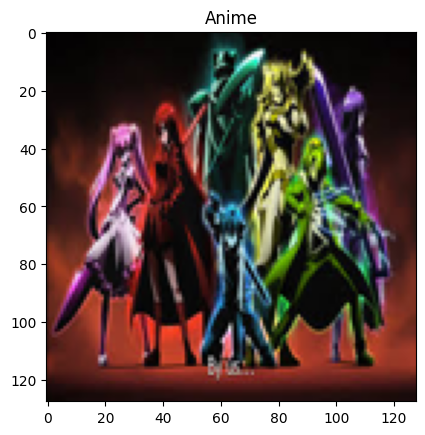

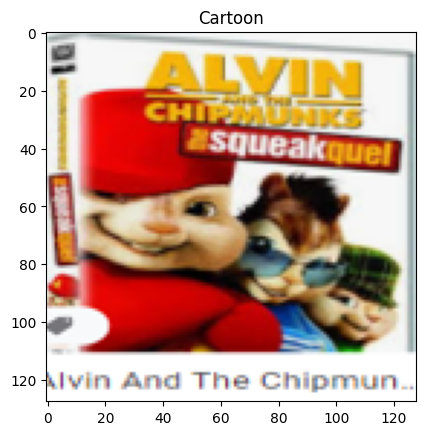

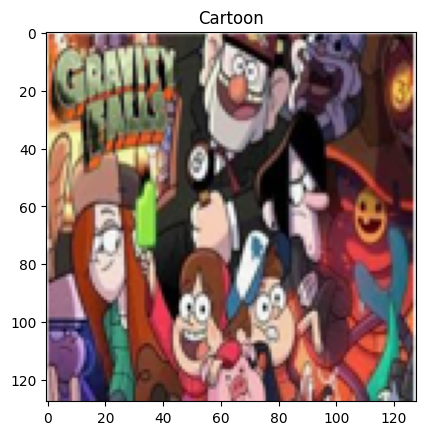

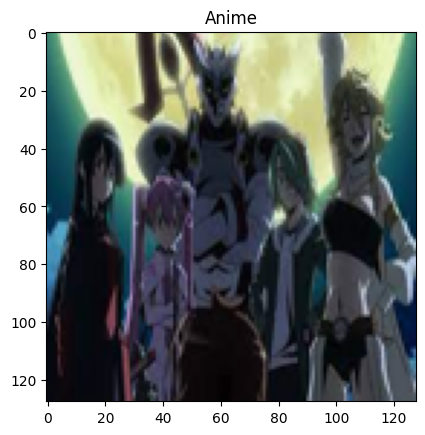

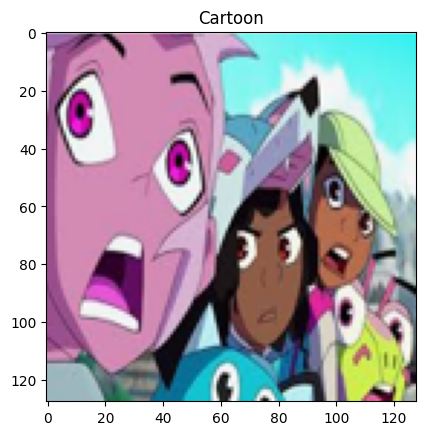

...

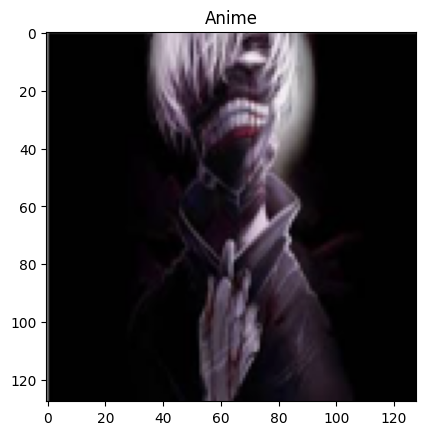

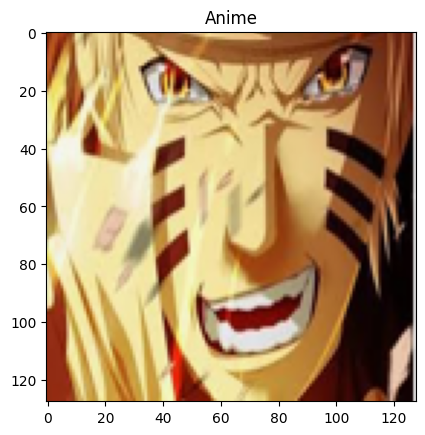

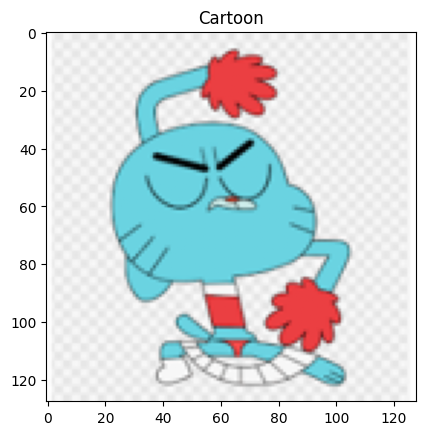

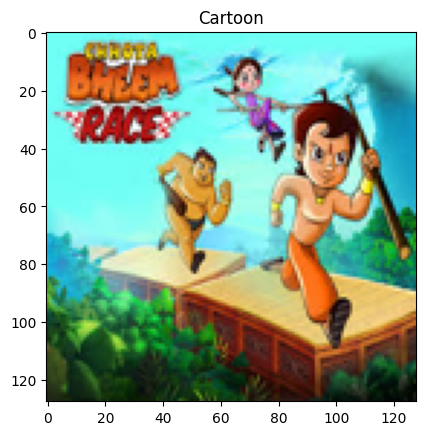

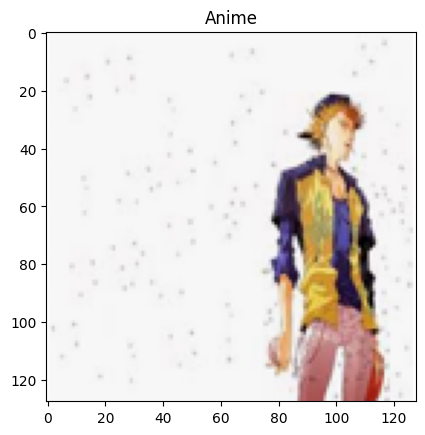

In [ ]:
# checking the train splint
labels_value = {0:'Anime', 1:'Cartoon'}
for i in range(25):
    plt.figure()
    plt.title(labels_value[labels_train[i]])
    plt.imshow(data_img_train[i])

<ipython-input-10-64c68335bfb8>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


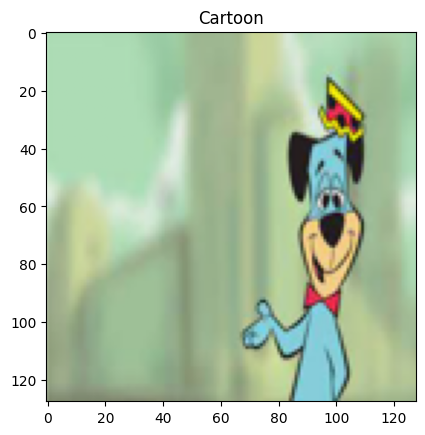

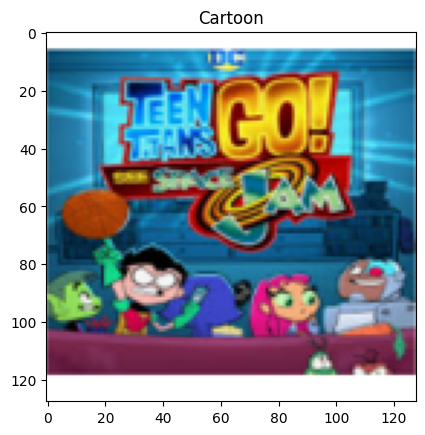

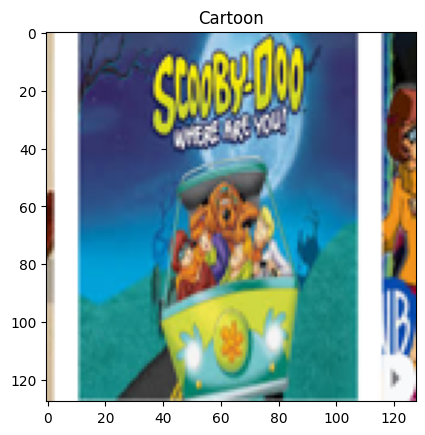

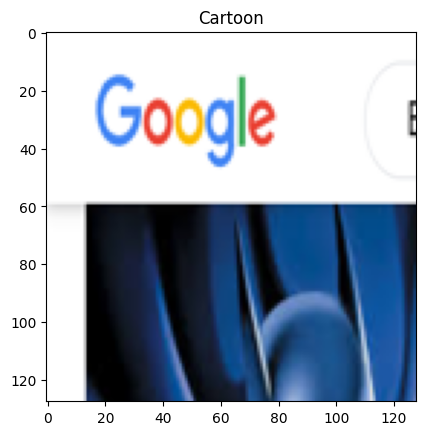

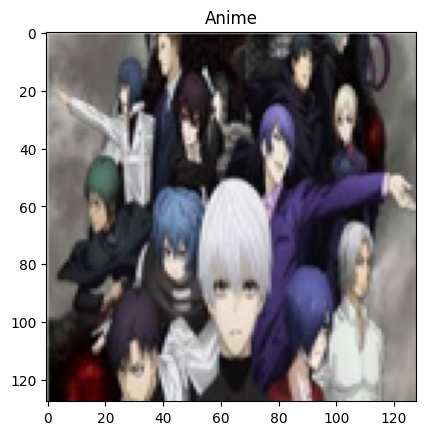

...

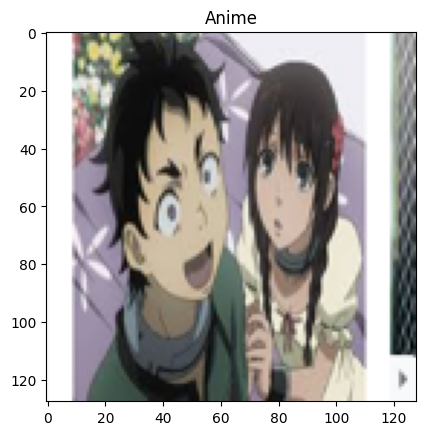

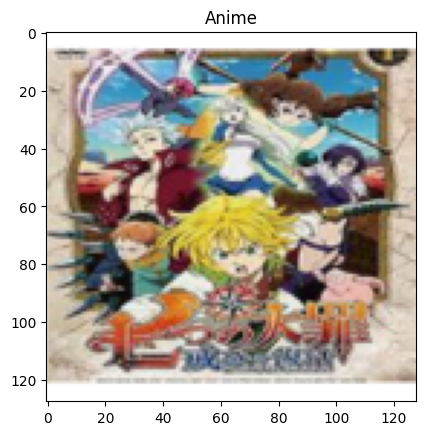

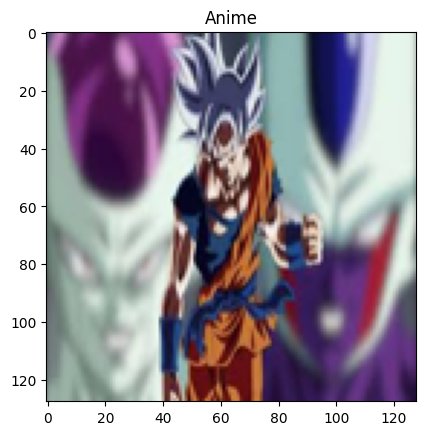

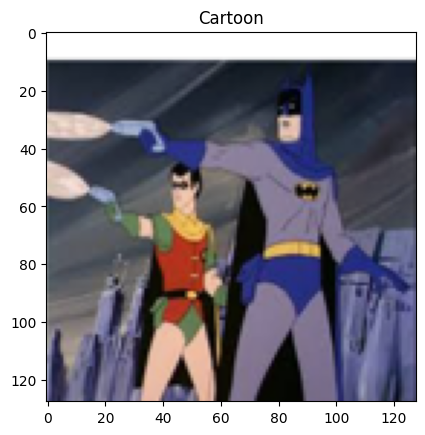

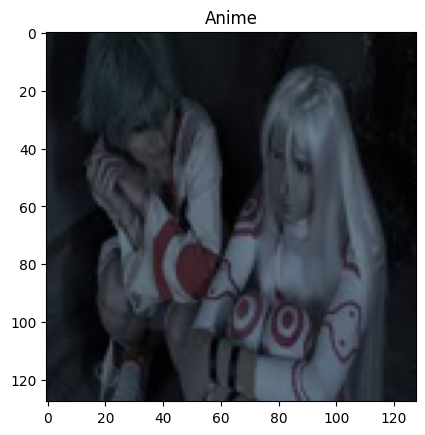

In [ ]:
# checking the test splint
labels_value = {0:'Anime', 1:'Cartoon'}
for i in range(25):
    plt.figure()
    plt.title(labels_value[labels_test[i]])
    plt.imshow(data_img_test[i])

### Saving the data of the images in a npy archive

In [ ]:
# train
np.save('img_data_train.npy', data_img_train)
loaded_data_train = np.load('img_data_train.npy')

# test
np.save('img_data_test.npy', data_img_test)
loaded_data_test = np.load('img_data_test.npy')

### Saving the label of the images in csv

In [ ]:
# train
data = {"animation Type" : labels_train}
df = pd.DataFrame(data)
df.to_csv("label_data_train.csv", index=False)

# test
data = {"animation Type" : labels_test}
df = pd.DataFrame(data)
df.to_csv("label_data_test.csv", index=False)

### Send training and testing data to Wandb

In [ ]:
#creating a wandb artifact
artifact = wandb.Artifact(name="img_data_train",
                                  type="split_data",
                                  description="train data of the images")

# add the file to the artifact
artifact.add_file('img_data_train.npy')
# save the artifact in W&B
wandb.run.log_artifact(artifact)

#creating a wandb artifact
artifact2 = wandb.Artifact(name="img_data_test",
                                  type="split_data",
                                  description="test data of the images")

# add the file to the artifact
artifact2.add_file('img_data_test.npy')
# save the artifact in W&B
wandb.run.log_artifact(artifact2)

#creating a wandb artifact
artifact3 = wandb.Artifact(name="label_data_train",
                                  type="split_data",
                                  description="labels of the train imagens")

# add the file to the artifact
artifact3.add_file('label_data_train.csv')
# save the artifact in W&B
wandb.run.log_artifact(artifact3)

#creating a wandb artifact
artifact4 = wandb.Artifact(name="label_data_test",
                                  type="split_data",
                                  description="labels of the test imagens")

# add the file to the artifact
artifact4.add_file('label_data_test.csv')
# save the artifact in W&B
wandb.run.log_artifact(artifact4)

<Artifact label_data_test>

In [ ]:
# closes wandb run
run.finish()